Data Source: https://www.kaggle.com/c/diabetic-retinopathy-detection

https://www.kaggle.com/datasets/tanlikesmath/diabetic-retinopathy-resized

# IMPORT LIBRARIES/DATASETS

In [2]:
!pip install tensorflow-addons==0.16.1
import tensorflow_addons as tfa

In [3]:
# Import the necessary packages
import os
import os.path
import os, shutil

from os import listdir

import numpy as np
import pandas as pd

import cv2

import tensorflow as tf
from tensorflow import keras

import glob
import PIL
from PIL import Image
from pathlib import Path

from pylab import rcParams

import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.utils import shuffle
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import precision_score, recall_score, confusion_matrix, classification_report, accuracy_score

from tensorflow.keras.applications import VGG19
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.applications import MobileNet
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.applications.inception_resnet_v2 import InceptionResNetV2

# import tensorflow_addons as tfa
from IPython.display import display
from tensorflow.keras import backend as K
from tensorflow.keras.utils import plot_model, to_categorical
from tensorflow.keras.optimizers import SGD, Adam
from tensorflow.keras.initializers import glorot_uniform
from tensorflow.keras.models import Model, load_model, Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import GlobalAveragePooling2D, Input, AveragePooling2D, Dense, Flatten, Dropout
from tensorflow.keras.layers import BatchNormalization, ZeroPadding2D, Conv2D, Activation, MaxPooling2D, MaxPool2D, Add
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint, LearningRateScheduler

In [4]:
# Import Tensorflow utility device_lib to get more information about the GPU
# This will help verify if TF is using the intended GPU
from tensorflow.python.client import device_lib

# Helper function to get information about all available GPUs in a list
def get_available_gpus():
    local_device_protos = device_lib.list_local_devices()
    return [x for x in local_device_protos if x.device_type == 'GPU']
# Get information of all available GPUs
gpu_info = get_available_gpus()
# Display GPU information
for i, gpu in enumerate(gpu_info):
    print(f"################## GPU: {i} ##########################")
    print(f"Device Type: {gpu.device_type}")
    print(f"GPU ID: {gpu.name}")
    print(f"Physical Device Description:\n\t{gpu.physical_device_desc}")
    print("####################################################")

################## GPU: 0 ##########################
Device Type: GPU
GPU ID: /device:GPU:0
Physical Device Description:
	device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
####################################################


In [6]:
# from google.colab import drive
# # Mount Google Drive
# drive.mount('/content/drive')

# # Specify the directory
# directory = '/content/drive/MyDrive/resized_train_cropped'

# # List all files in the directory
# files = os.listdir(directory)
# image_extensions = ('.jpeg')
# image_files = [file for file in files if file.lower().endswith(image_extensions)]

# # Count the number of image files
# num_images = len(image_files)

# print(f'There are {num_images} image files in the directory {directory}.')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


KeyboardInterrupt: 

In [ ]:
from google.colab import files
files.upload() #upload your kaggle.json file

!mkdir ~/.kaggle #create a directory called .kaggle in the root folder
!cp kaggle.json ~/.kaggle/ #copy kaggle.json to this folder
!chmod 600 ~/.kaggle/kaggle.json #add full rights to this copied file
!rm kaggle.json #remove the original one

!kaggle datasets download -d tanlikesmath/diabetic-retinopathy-resized
!unzip diabetic-retinopathy-resized.zip  #unzip the zip file
!rm diabetic-retinopathy-resized.zip

In [ ]:
for idx in range(1):
  print(idx)

0


In [7]:
# Specify the directory
directory = '/content/drive/MyDrive/resized_train_cropped'

# List all files in the directory
files = os.listdir(directory)

# Filter out the image files (assuming images have extensions like .jpeg)
image_extensions = ('.jpeg')
image_files = [file for file in files if file.lower().endswith(image_extensions)]

# Prepare lists to store the data
names = []
labels = []
paths = []

# Iterate through the image files and extract information
for file in image_files:
    # Split the filename to get the name and side (left/right)
    name, side_ext = file.rsplit('_', 1)
    side, ext = side_ext.split('.', 1)

    # Determine the label: 0 for left, 1 for right
    label = 0 if side == 'left' else 1 if side == 'right' else None

    # Store the extracted information
    names.append(name)
    labels.append(label)
    paths.append(os.path.join(directory, file))

# Create a DataFrame with the collected data
df = pd.DataFrame({
    'name': names,
    'label': labels,
    'path': paths
})

# Shuffle the DataFrame
df = df.sample(frac=1).reset_index(drop=True)

# Display the first few rows of the DataFrame
print(df.head(10))

    name  label                                               path
0  35199    1.0  /content/drive/MyDrive/resized_train_cropped/3...
1  24528    0.0  /content/drive/MyDrive/resized_train_cropped/2...
2  40777    0.0  /content/drive/MyDrive/resized_train_cropped/4...
3  21620    0.0  /content/drive/MyDrive/resized_train_cropped/2...
4   2123    0.0  /content/drive/MyDrive/resized_train_cropped/2...
5  40499    0.0  /content/drive/MyDrive/resized_train_cropped/4...
6  38891    1.0  /content/drive/MyDrive/resized_train_cropped/3...
7  33456    0.0  /content/drive/MyDrive/resized_train_cropped/3...
8  33828    0.0  /content/drive/MyDrive/resized_train_cropped/3...
9  33260    0.0  /content/drive/MyDrive/resized_train_cropped/3...


In [8]:
# Save the DataFrame to a CSV file
df.to_csv('/content/image_data.csv', index=False)


<Axes: xlabel='label'>

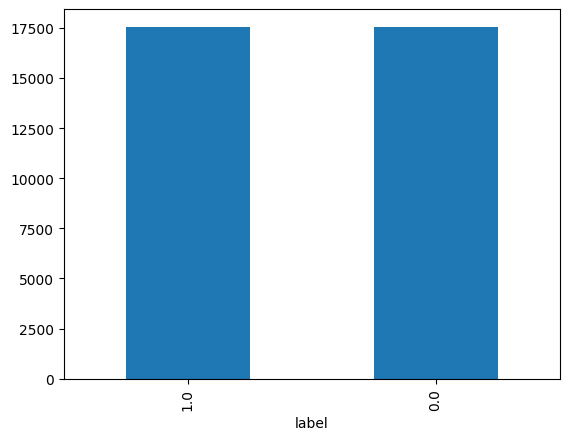

In [9]:
df['label'].value_counts().plot(kind = 'bar')

In [10]:
# base_image_dir = "/content/drive/MyDrive/resized_train_cropped"
# df['path'] = df['image'].map(lambda x: os.path.join(base_image_dir,'resized_train_cropped','{}.jpeg'.format(x)))
# df = df.drop(columns=['image'])
# df = df.sample(frac=1).reset_index(drop=True) #shuffle dataframe
# df['level'] = (df['level'] > 1).astype(int) # Disease or no disease
# df.head(10)

KeyError: 'image'

In [11]:
df = df[:1000]
len(df)

1000

In [12]:
os.path.exists(df['path'][0])

True

In [ ]:
# # Separate majority and minority classes
# df_majority = df[df.iloc[:,4608]==1]
# df_minority = df[df.iloc[:,4608]==0]

# # Downsample majority class
# df_majority_downsampled = resample(df_majority,
#                                  replace=False,
#                                  n_samples=1000)
# #Upsample minority class
# df_minority_upsampled = resample(df_minority,
#                                  replace=True,
#                                  n_samples=1000)
# # Combine minority class with downsampled majority class
# df_up_down_sampled = pd.concat([df_majority_downsampled, df_minority_upsampled])

IndexError: single positional indexer is out-of-bounds

In [ ]:
df['level'].unique()

array([1, 0])

In [ ]:
df['path'][0]

'/content/drive/MyDrive/resized_train_cropped/24668_right.jpeg'

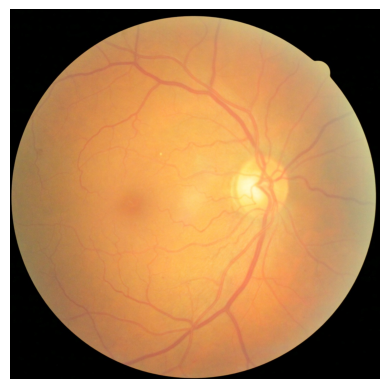

In [ ]:
# img = cv2.imread(df['path'][0])
# img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
# plt.imshow(img)

image_path = df['path'][0]
if not os.path.exists(image_path):
    raise FileNotFoundError(f"The path {image_path} does not exist.")

# Read the image using OpenCV
img = cv2.imread(image_path)

# Check if the image was successfully read
if img is None:
    raise ValueError(f"Failed to read the image from {image_path}")

# Convert the image from BGR (OpenCV default) to RGB (matplotlib expects RGB)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Display the image using matplotlib
plt.imshow(img_rgb)
plt.axis('off')  # Turn off axis numbers and ticks
plt.show()

In [13]:
# from PIL import Image

# dim = (224, 224)

# X_image_train = []
# Y_image = []

# # Print the number of rows in the DataFrame
# print(len(df))

# for i in range(len(df)):
#     img = Image.open(df['path'][i]).convert('RGB')
#     im_resized = img.resize(dim)
#     X_image_train.append(im_resized)
#     Y_image.append(df['label'][i])  # Assuming 'label' is the correct column name


# print(len(X_image_train))

# Taking too much time , using gpu
import tensorflow as tf
import pandas as pd

# Ensure your DataFrame `df` is already defined and contains the paths and labels
dim = (224, 224)

# Initialize lists to store the processed images and labels
X_image_train = []
Y_image = []

# Print the number of rows in the DataFrame
print(len(df))

# Define a function to load and preprocess images
def load_and_preprocess_image(path):
    img = tf.io.read_file(path)
    img = tf.image.decode_image(img, channels=3)
    img = tf.image.resize(img, dim)
    return img

# Process the images using TensorFlow functions
for i in range(len(df)):
    img = load_and_preprocess_image(df['path'][i])
    X_image_train.append(img.numpy())  # Convert Tensor to NumPy array
    Y_image.append(df['label'][i])  # Assuming 'label' is the correct column name

# Print the number of processed images
print(len(X_image_train))


1000
1000


In [14]:
# Images --> numpy arrays --> store in  X_image_array
X_image_array = []
for x in range(len(X_image_train)):
    X_image = np.array(X_image_train[x], dtype='uint8')
    X_image_array.append(X_image)

# Convert the list of image arrays to a numpy array
features = np.array(X_image_array)
print(features.shape)

# Convert the labels to a numpy array
labels = np.array(Y_image, dtype='uint8').reshape(-1, 1)
print(labels.shape)

(1000, 224, 224, 3)
(1000, 1)


<ipython-input-14-ccedd1e379fb>:12: RuntimeWarning: invalid value encountered in cast
  labels = np.array(Y_image, dtype='uint8').reshape(-1, 1)


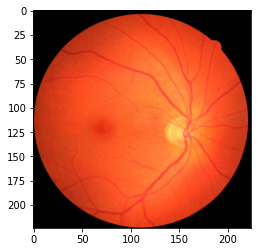

In [ ]:
plt.imshow(X_image_train[0])

In [15]:
trainX, x_test, trainY, y_test = train_test_split(features, labels, test_size=0.2, random_state=5, stratify=labels)


# RES-BLOCK MODEL

## BUILD

In [16]:
trainAug = ImageDataGenerator(rotation_range=15, fill_mode="nearest")
baseModel = ResNet50(weights="imagenet", include_top=False, input_tensor=Input(shape=(224, 224, 3)))

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [17]:
headModel = baseModel.output
headModel = AveragePooling2D(pool_size=(4, 4))(headModel)
#headModel = Flatten(name="flatten")(headModel)
headModel = Dense(1024, activation="relu")(headModel)
headModel = Dense(512, activation="relu")(headModel)
headModel = Dense(64, activation="relu")(headModel)
headModel = Dropout(0.5)(headModel)
headModel = GlobalAveragePooling2D()(headModel)
headModel = Dense(2, activation="softmax")(headModel)

In [18]:
res_model = Model(inputs=baseModel.input, outputs=headModel)
for layer in baseModel.layers:
    layer.trainable = True

## COMPILE

In [19]:
res_model.compile(optimizer = 'adam', loss = 'SparseCategoricalCrossentropy', metrics= ['accuracy'])

In [22]:
earlystopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=5)
checkpointer = ModelCheckpoint(filepath="RES_weights.keras", verbose=1, save_best_only=True)

## TRAINING

In [23]:
res_history = res_model.fit(x=trainX,
                            y=trainY,
                            batch_size=8,
                            epochs=10,
                            validation_split=0.1,
                            callbacks=[checkpointer, earlystopping],)

Epoch 1/10
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - accuracy: 0.5696 - loss: 0.7779
Epoch 1: val_loss improved from inf to 22660.98047, saving model to RES_weights.keras
90/90 ━━━━━━━━━━━━━━━━━━━━ 86s 226ms/step - accuracy: 0.5700 - loss: 0.7768 - val_accuracy: 0.5500 - val_loss: 22660.9805
Epoch 2/10
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - accuracy: 0.6464 - loss: 0.7268
Epoch 2: val_loss did not improve from 22660.98047
90/90 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - accuracy: 0.6463 - loss: 0.7287 - val_accuracy: 0.5500 - val_loss: 14817864.0000
Epoch 3/10
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.6633 - loss: 0.6521
Epoch 3: val_loss improved from 22660.98047 to 6.29135, saving model to RES_weights.keras
90/90 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - accuracy: 0.6630 - loss: 0.6518 - val_accuracy: 0.6500 - val_loss: 6.2914
Epoch 4/10
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - accuracy: 0.6754 - loss: 0.5670
Epoch 4: val_loss improved from 6.29135 to 1.64265, saving model to R

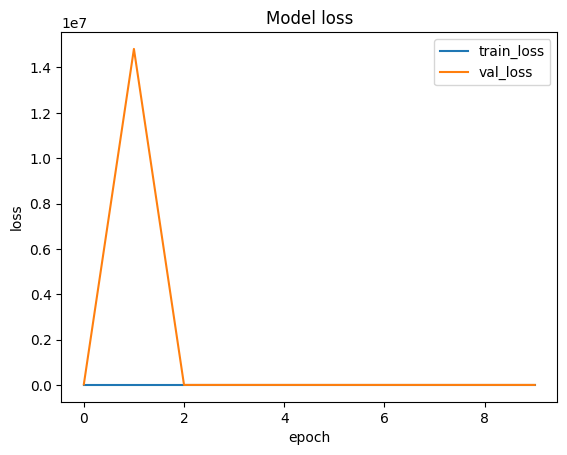

In [24]:
plt.plot(res_history.history['loss'])
plt.plot(res_history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train_loss','val_loss'], loc = 'upper right')
plt.show()

## PERFORMANCE OF THE TRAINED MODEL

In [25]:
res_model.load_weights("RES_weights.keras")

evaluate = res_model.evaluate(x_test, y_test)
print('Accuracy Test : {}'.format(evaluate[1]))

7/7 ━━━━━━━━━━━━━━━━━━━━ 9s 308ms/step - accuracy: 0.6455 - loss: 0.5844
Accuracy Test : 0.6600000262260437


In [26]:
# import cv2
prediction = []
original = y_test
image = []
count = 0

for item in x_test:
    img= item
    img = img.reshape(-1,224,224,3)
    predict = res_model.predict(img)
    predict = np.argmax(predict)
    prediction.append(predict)

# Getting the test accuracy
score = accuracy_score(original, prediction)
print("Test Accuracy : {}".format(score))

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━

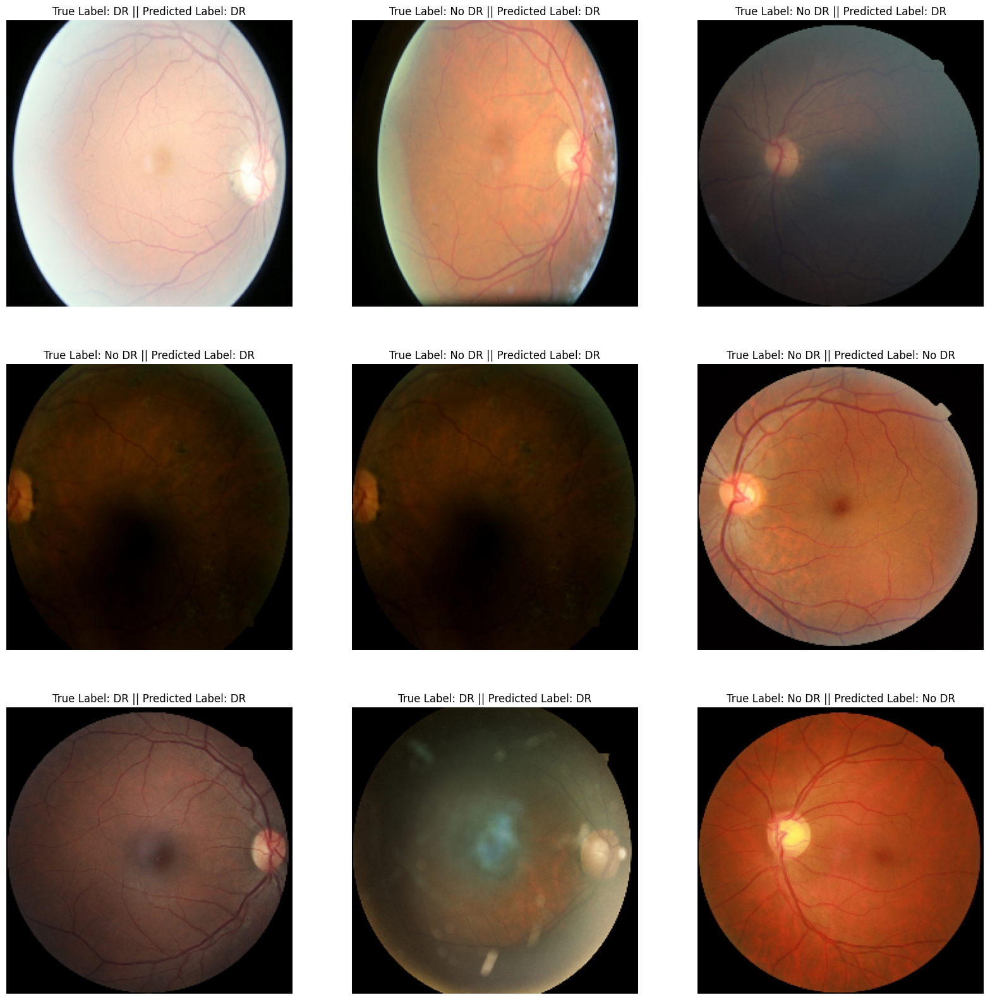

In [27]:
class_names = ['No DR','DR']
import random
plt.figure(figsize = (20,20))
for i in range(9):
    random_int_index = random.choice(range(len(x_test)))
    plt.subplot(3,3,i+1)
    plt.imshow(x_test[random_int_index])
    if prediction[random_int_index] == original[random_int_index]:
        color = "g"
    else:
        color = "r"
    plt.title("True Label: " + class_names[original[random_int_index][0]] + " || " + "Predicted Label: " +
              class_names[prediction[random_int_index]])
    plt.axis(False);

In [28]:
# accuracy, sensitivity, and specificity
cm = confusion_matrix(np.asarray(original), np.asarray(prediction))
total = sum(sum(cm))
acc = (cm[0, 0] + cm[1, 1]) / total
sensitivity = cm[0, 0] / (cm[0, 0] + cm[0, 1])
specificity = cm[1, 1] / (cm[1, 0] + cm[1, 1])
# show the confusion matrix, accuracy, sensitivity, and specificity
print(cm)
print("acc: {:.4f}".format(acc))
print("sensitivity: {:.4f}".format(sensitivity))
print("specificity: {:.4f}".format(specificity))

[[40 65]
 [ 3 92]]
acc: 0.6600
sensitivity: 0.3810
specificity: 0.9684


In [29]:
# Print out the classification report
print(classification_report(np.asarray(original), np.asarray(prediction)))

              precision    recall  f1-score   support

           0       0.93      0.38      0.54       105
           1       0.59      0.97      0.73        95

    accuracy                           0.66       200
   macro avg       0.76      0.67      0.64       200
weighted avg       0.77      0.66      0.63       200



# VGG-19 MODEL

## BUILD

In [30]:
  trainAug = ImageDataGenerator(rotation_range=15, fill_mode="nearest")
  baseModel = VGG19(weights="imagenet", include_top=False, input_tensor=Input(shape=(224, 224, 3)))
  baseModel.summary()

80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "vgg19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 224, 224, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 224, 224, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 112, 112, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv4 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv4 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 14, 14, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv4 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 20,024,384 (76.39 MB)

 Trainable params: 20,024,384 (76.39 MB)

 Non-trainable params: 0 (0.00 B)

In [31]:
headModel = baseModel.output
headModel = AveragePooling2D(pool_size=(4, 4))(headModel)
#headModel = Flatten(name="flatten")(headModel)
headModel = Dense(1024, activation="relu")(headModel)
headModel = Dense(512, activation="relu")(headModel)
headModel = Dense(64, activation="relu")(headModel)
headModel = Dropout(0.5)(headModel)
headModel = GlobalAveragePooling2D()(headModel)
headModel = Dense(2, activation="softmax")(headModel)

vgg_model = Model(inputs=baseModel.input, outputs=headModel)
for layer in baseModel.layers:
    layer.trainable = False

## COMPILE

In [32]:
vgg_model.compile(optimizer = 'adam', loss = 'SparseCategoricalCrossentropy', metrics= ['accuracy'])

In [34]:
earlystopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=5)
checkpointer = ModelCheckpoint(filepath="VGG_weights.keras", verbose=1, save_best_only=True)

## TRAINING

In [35]:
print("[INFO] training head...")
vgg_history = vgg_model.fit(x=trainX,
                            y=trainY,
                            batch_size=8,
                            epochs=15,
                            validation_split=0.1,
                            callbacks=[checkpointer, earlystopping],)

[INFO] training head...
Epoch 1/15
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.6132 - loss: 0.9318
Epoch 1: val_loss improved from inf to 0.79595, saving model to VGG_weights.keras
90/90 ━━━━━━━━━━━━━━━━━━━━ 18s 93ms/step - accuracy: 0.6136 - loss: 0.9295 - val_accuracy: 0.6250 - val_loss: 0.7960
Epoch 2/15
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.7291 - loss: 0.5421
Epoch 2: val_loss improved from 0.79595 to 0.38538, saving model to VGG_weights.keras
90/90 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7295 - loss: 0.5416 - val_accuracy: 0.8125 - val_loss: 0.3854
Epoch 3/15
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.8715 - loss: 0.2990
Epoch 3: val_loss did not improve from 0.38538
90/90 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.8717 - loss: 0.2988 - val_accuracy: 0.6625 - val_loss: 1.0175
Epoch 4/15
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.8938 - loss: 0.2771
Epoch 4: val_loss improved from 0.38538 to 0.29254, saving model to VG

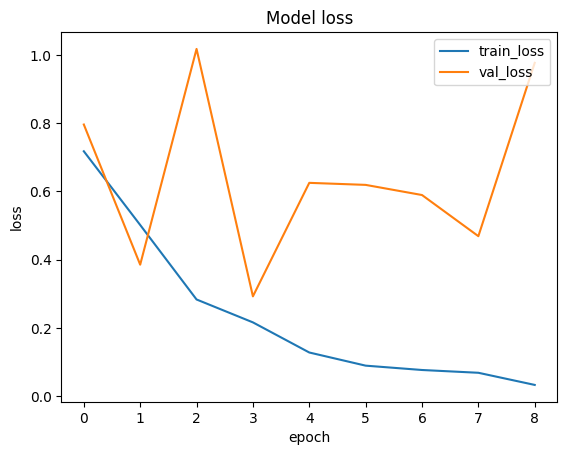

In [36]:
plt.plot(vgg_history.history['loss'])
plt.plot(vgg_history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train_loss','val_loss'], loc = 'upper right')
plt.show()

## PERFORMANCE OF THE TRAINED MODEL

In [38]:
vgg_model.load_weights("VGG_weights.keras")

evaluate = vgg_model.evaluate(x_test, y_test)
print('Accuracy Test : {}'.format(evaluate[1]))

7/7 ━━━━━━━━━━━━━━━━━━━━ 14s 220ms/step - accuracy: 0.8876 - loss: 0.2449
Accuracy Test : 0.9049999713897705


In [39]:
# import cv2
prediction = []
original = y_test
image = []
count = 0

for item in x_test:
    img= item
    img = img.reshape(-1,224,224,3)
    predict = vgg_model.predict(img)
    predict = np.argmax(predict)
    prediction.append(predict)

# Getting the test accuracy
score = accuracy_score(original, prediction)
print("Test Accuracy : {}".format(score))

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━

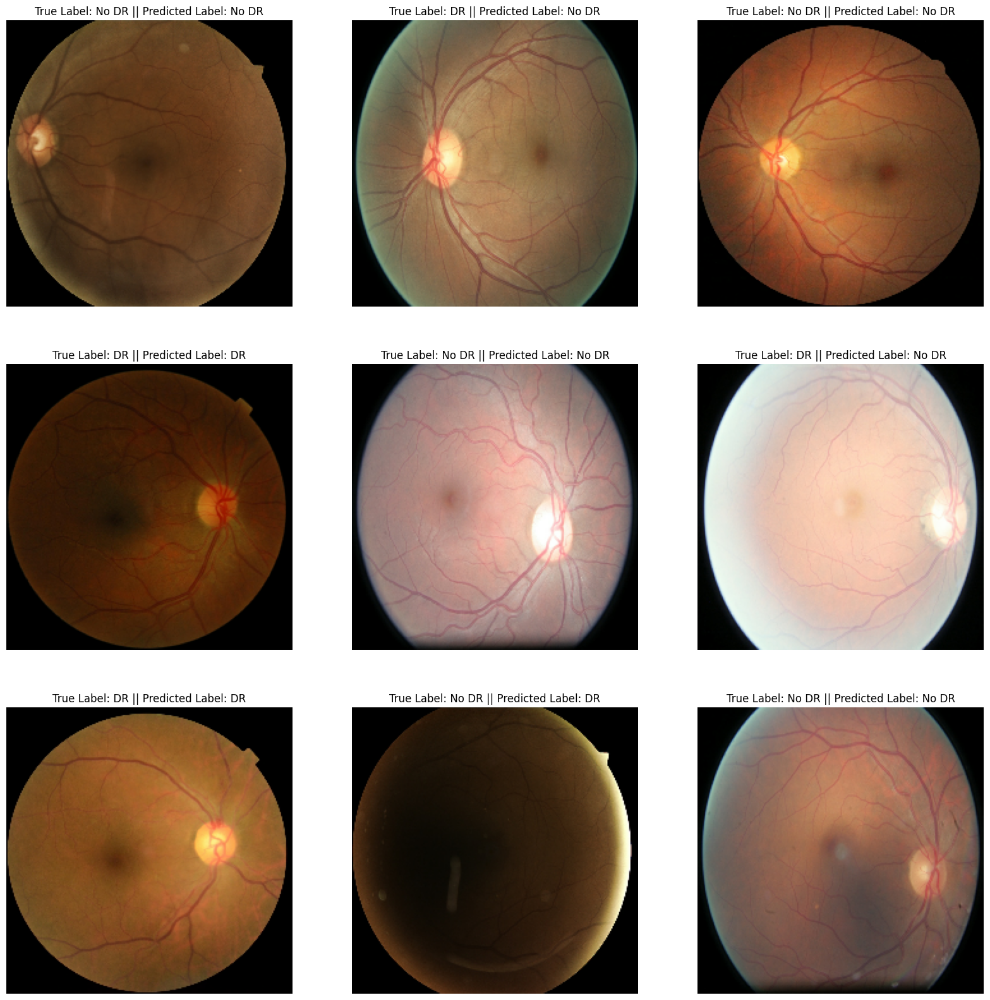

In [40]:
class_names = ['No DR','DR']
import random
plt.figure(figsize = (20,20))
for i in range(9):
    random_int_index = random.choice(range(len(x_test)))
    plt.subplot(3,3,i+1)
    plt.imshow(x_test[random_int_index])
    if prediction[random_int_index] == original[random_int_index]:
        color = "g"
    else:
        color = "r"
    plt.title("True Label: " + class_names[original[random_int_index][0]] + " || " + "Predicted Label: " +
              class_names[prediction[random_int_index]])
    plt.axis(False);

In [41]:
# accuracy, sensitivity, and specificity
cm = confusion_matrix(np.asarray(original), np.asarray(prediction))
total = sum(sum(cm))
acc = (cm[0, 0] + cm[1, 1]) / total
sensitivity = cm[0, 0] / (cm[0, 0] + cm[0, 1])
specificity = cm[1, 1] / (cm[1, 0] + cm[1, 1])
# show the confusion matrix, accuracy, sensitivity, and specificity
print(cm)
print("acc: {:.4f}".format(acc))
print("sensitivity: {:.4f}".format(sensitivity))
print("specificity: {:.4f}".format(specificity))

[[94 11]
 [ 8 87]]
acc: 0.9050
sensitivity: 0.8952
specificity: 0.9158


In [42]:
# Print out the classification report
print(classification_report(np.asarray(original), np.asarray(prediction)))

              precision    recall  f1-score   support

           0       0.92      0.90      0.91       105
           1       0.89      0.92      0.90        95

    accuracy                           0.91       200
   macro avg       0.90      0.91      0.90       200
weighted avg       0.91      0.91      0.91       200



# DENSE-NET MODEL

## BUILD

In [43]:
trainAug = ImageDataGenerator(rotation_range=15, fill_mode="nearest")
baseModel = DenseNet121(weights="imagenet", include_top=False, input_tensor=Input(shape=(224, 224, 3)))
baseModel.summary()

29084464/29084464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "densenet121"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d            │ (None, 230, 230, 3)    │              0 │ input_layer_2[0][0]    │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,408 │ zero_padding2d[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 112, 112, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 112, 112, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d_1          │ (None, 114, 114, 64)   │              0 │ conv1_relu[0][0]       │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1 (MaxPooling2D)      │ (None, 56, 56, 64)     │              0 │ zero_padding2d_1[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_bn         │ (None, 56, 56, 64)     │            256 │ pool1[0][0]            │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_0_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 128)    │          8,192 │ conv2_block1_0_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 128)    │            512 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 128)    │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 32)     │         36,864 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_concat       │ (None, 56, 56, 96)     │              0 │ pool1[0][0],           │
│ (Concatenate)             │                        │                │ conv2_block1_2_conv[0… │
├──────────────────────

 Total params: 7,037,504 (26.85 MB)

 Trainable params: 6,953,856 (26.53 MB)

 Non-trainable params: 83,648 (326.75 KB)

In [44]:
headModel = baseModel.output
headModel = AveragePooling2D(pool_size=(4, 4))(headModel)
#headModel = Flatten(name="flatten")(headModel)
headModel = Dense(1024, activation="relu")(headModel)
headModel = Dense(512, activation="relu")(headModel)
headModel = Dense(64, activation="relu")(headModel)
headModel = Dropout(0.5)(headModel)
headModel = GlobalAveragePooling2D()(headModel)
headModel = Dense(2, activation="softmax")(headModel)

densenet_model = Model(inputs=baseModel.input, outputs=headModel)

for layer in baseModel.layers:
    layer.trainable = False

## COMPILE

In [51]:
densenet_model.compile(optimizer = 'adam', loss = 'SparseCategoricalCrossentropy', metrics= ['accuracy'])

In [52]:
earlystopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=15)
checkpointer = ModelCheckpoint(filepath="DENSENET121_weights.keras", verbose=1, save_best_only=True)

## TRAINING

In [53]:
print("[INFO] training head...")
densenet_history = densenet_model.fit(x=trainX,
                                      y=trainY,
                                      batch_size=8,
                                      epochs=20,
                                      validation_split=0.1,
                                      callbacks=[checkpointer, earlystopping],)

[INFO] training head...
Epoch 1/20
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.5121 - loss: 0.6931
Epoch 1: val_loss improved from inf to 0.69000, saving model to DENSENET121_weights.keras
90/90 ━━━━━━━━━━━━━━━━━━━━ 32s 142ms/step - accuracy: 0.5122 - loss: 0.6931 - val_accuracy: 0.5500 - val_loss: 0.6900
Epoch 2/20
89/90 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.5389 - loss: 0.6909
Epoch 2: val_loss improved from 0.69000 to 0.68986, saving model to DENSENET121_weights.keras
90/90 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step - accuracy: 0.5385 - loss: 0.6909 - val_accuracy: 0.5500 - val_loss: 0.6899
Epoch 3/20
89/90 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - accuracy: 0.5429 - loss: 0.6905
Epoch 3: val_loss improved from 0.68986 to 0.68973, saving model to DENSENET121_weights.keras
90/90 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step - accuracy: 0.5424 - loss: 0.6905 - val_accuracy: 0.5500 - val_loss: 0.6897
Epoch 4/20
89/90 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.5100 - loss: 0.6935
Epoch 4:

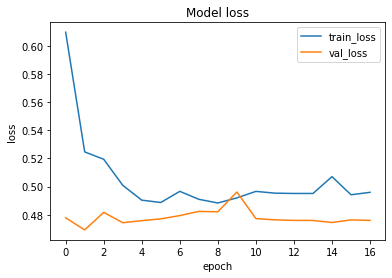

In [ ]:
plt.plot(densenet_history.history['loss'])
plt.plot(densenet_history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train_loss','val_loss'], loc = 'upper right')
plt.show()

## PERFORMANCE OF THE TRAINED MODEL

In [ ]:
densenet_model.load_weights("DENSENET121_weights.hdf5")

evaluate = densenet_model.evaluate(x_test, y_test)
print('Accuracy Test : {}'.format(evaluate[1]))

32/32 [==============================] - 4s 58ms/step - loss: 0.4908 - accuracy: 0.8060
Accuracy Test : 0.8059999942779541


In [ ]:
# import cv2
prediction = []
original = y_test
image = []
count = 0

for item in x_test:
    img= item
    img = img.reshape(-1,224,224,3)
    predict = densenet_model.predict(img)
    predict = np.argmax(predict)
    prediction.append(predict)

# Getting the test accuracy
score = accuracy_score(original, prediction)
print("Test Accuracy : {}".format(score))

Test Accuracy : 0.806


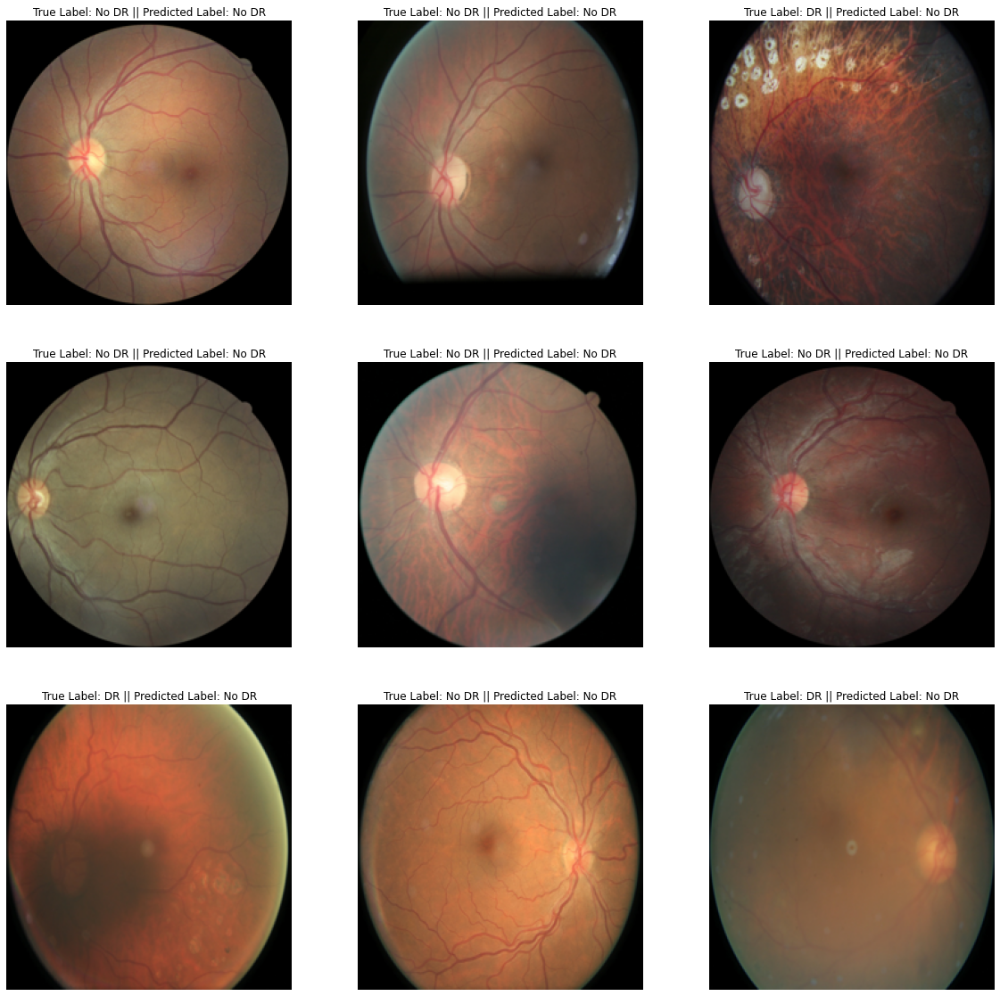

In [ ]:
class_names = ['No DR','DR']
import random
plt.figure(figsize = (20,20))
for i in range(9):
    random_int_index = random.choice(range(len(x_test)))
    plt.subplot(3,3,i+1)
    plt.imshow(x_test[random_int_index])
    if prediction[random_int_index] == original[random_int_index]:
        color = "g"
    else:
        color = "r"
    plt.title("True Label: " + class_names[original[random_int_index][0]] + " || " + "Predicted Label: " +
              class_names[prediction[random_int_index]])
    plt.axis(False);

In [ ]:
# accuracy, sensitivity, and specificity
cm = confusion_matrix(np.asarray(original), np.asarray(prediction))
total = sum(sum(cm))
acc = (cm[0, 0] + cm[1, 1]) / total
sensitivity = cm[0, 0] / (cm[0, 0] + cm[0, 1])
specificity = cm[1, 1] / (cm[1, 0] + cm[1, 1])
# show the confusion matrix, accuracy, sensitivity, and specificity
print(cm)
print("acc: {:.4f}".format(acc))
print("sensitivity: {:.4f}".format(sensitivity))
print("specificity: {:.4f}".format(specificity))

[[806   0]
 [194   0]]
acc: 0.8060
sensitivity: 1.0000
specificity: 0.0000


In [ ]:
# Print out the classification report
print(classification_report(np.asarray(original), np.asarray(prediction)))

              precision    recall  f1-score   support

           0       0.81      1.00      0.89       806
           1       0.00      0.00      0.00       194

    accuracy                           0.81      1000
   macro avg       0.40      0.50      0.45      1000
weighted avg       0.65      0.81      0.72      1000



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


# MOBILE-NET MODEL

## BUILD

In [ ]:
trainAug = ImageDataGenerator(rotation_range=15, fill_mode="nearest")
baseModel = MobileNet(weights="imagenet", include_top=False, input_tensor=Input(shape=(224, 224, 3)))

baseModel.summary()

17235968/17225924 [==============================] - 0s 0us/step
Model: "mobilenet_1.00_224"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv1 (Conv2D)              (None, 112, 112, 32)      864       
                                                                 
 conv1_bn (BatchNormalizatio  (None, 112, 112, 32)     128       
 n)                                                              
                                                                 
 conv1_relu (ReLU)           (None, 112, 112, 32)      0         
                                                                 
 conv_dw_1 (DepthwiseConv2D)  (None, 112, 112, 32)     288       
                                                                 
 conv_dw_1_bn (BatchNormaliz  (None, 112, 112, 32

In [ ]:
headModel = baseModel.output
headModel = AveragePooling2D(pool_size=(4, 4))(headModel)
#headModel = Flatten(name="flatten")(headModel)
headModel = Dense(1024, activation="relu")(headModel)
headModel = Dense(512, activation="relu")(headModel)
headModel = Dense(64, activation="relu")(headModel)
headModel = Dropout(0.5)(headModel)
headModel = GlobalAveragePooling2D()(headModel)
headModel = Dense(2, activation="softmax")(headModel)

mobilenet_model = Model(inputs=baseModel.input, outputs=headModel)

for layer in baseModel.layers:
    layer.trainable = False

## COMPILE

In [ ]:
mobilenet_model.compile(optimizer = 'adam', loss = 'SparseCategoricalCrossentropy', metrics= ['accuracy'])

In [ ]:
earlystopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=5)
checkpointer = ModelCheckpoint(filepath="MOBILENET_weights.hdf5", verbose=1, save_best_only=True)

## TRAINING

In [ ]:
print("[INFO] training head...")
mobilenet_history = mobilenet_model.fit(x=trainX,
                                        y=trainY,
                                        batch_size=8,
                                        epochs=50,
                                        validation_split=0.1,
                                        callbacks=[checkpointer, earlystopping],)

[INFO] training head...
Epoch 1/50
445/450 [============================>.] - ETA: 0s - loss: 0.5798 - accuracy: 0.7919
Epoch 1: val_loss improved from inf to 0.49666, saving model to MOBILENET_weights.hdf5
450/450 [==============================] - 7s 11ms/step - loss: 0.5789 - accuracy: 0.7919 - val_loss: 0.4967 - val_accuracy: 0.8175
Epoch 2/50
448/450 [============================>.] - ETA: 0s - loss: 0.5200 - accuracy: 0.8036
Epoch 2: val_loss improved from 0.49666 to 0.48555, saving model to MOBILENET_weights.hdf5
450/450 [==============================] - 5s 10ms/step - loss: 0.5198 - accuracy: 0.8039 - val_loss: 0.4856 - val_accuracy: 0.8175
Epoch 3/50
445/450 [============================>.] - ETA: 0s - loss: 0.5121 - accuracy: 0.8014
Epoch 3: val_loss did not improve from 0.48555
450/450 [==============================] - 4s 9ms/step - loss: 0.5117 - accuracy: 0.8019 - val_loss: 0.4938 - val_accuracy: 0.8175
Epoch 4/50
447/450 [============================>.] - ETA: 0s - loss

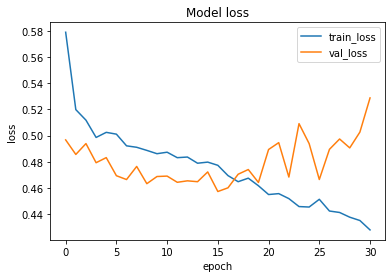

In [ ]:
plt.plot(mobilenet_history.history['loss'])
plt.plot(mobilenet_history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train_loss','val_loss'], loc = 'upper right')
plt.show()

## PERFORMANCE OF THE TRAINED MODEL

In [ ]:
mobilenet_model.load_weights("MOBILENET_weights.hdf5")

evaluate = mobilenet_model.evaluate(x_test, y_test)
print('Accuracy Test : {}'.format(evaluate[1]))

32/32 [==============================] - 2s 25ms/step - loss: 0.4842 - accuracy: 0.8060
Accuracy Test : 0.8059999942779541


In [ ]:
# import cv2
prediction = []
original = y_test
image = []
count = 0

for item in x_test:
    img= item
    img = img.reshape(-1,224,224,3)
    predict = mobilenet_model.predict(img)
    predict = np.argmax(predict)
    prediction.append(predict)

# Getting the test accuracy
score = accuracy_score(original, prediction)
print("Test Accuracy : {}".format(score))

Test Accuracy : 0.806


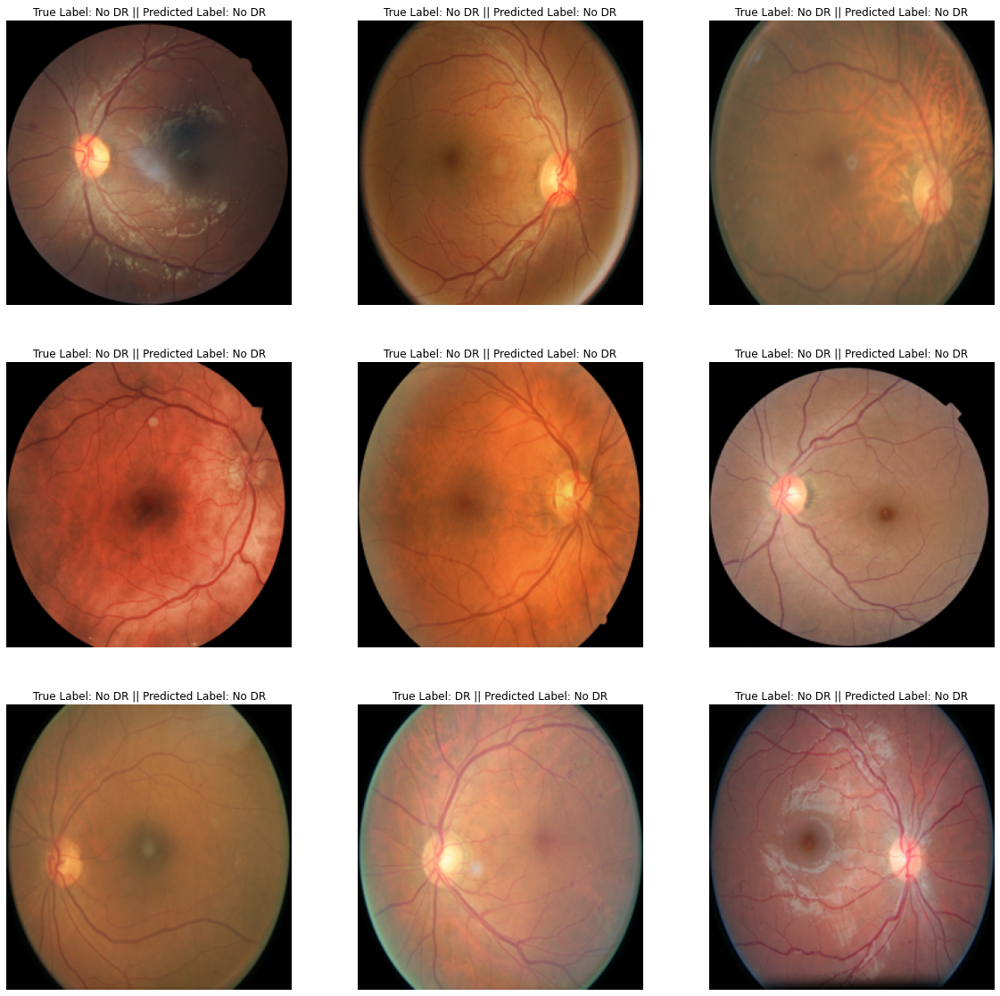

In [ ]:
class_names = ['No DR','DR']
import random
plt.figure(figsize = (20,20))
for i in range(9):
    random_int_index = random.choice(range(len(x_test)))
    plt.subplot(3,3,i+1)
    plt.imshow(x_test[random_int_index])
    if prediction[random_int_index] == original[random_int_index]:
        color = "g"
    else:
        color = "r"
    plt.title("True Label: " + class_names[original[random_int_index][0]] + " || " + "Predicted Label: " +
              class_names[prediction[random_int_index]])
    plt.axis(False);

In [ ]:
# accuracy, sensitivity, and specificity
cm = confusion_matrix(np.asarray(original), np.asarray(prediction))
total = sum(sum(cm))
acc = (cm[0, 0] + cm[1, 1]) / total
sensitivity = cm[0, 0] / (cm[0, 0] + cm[0, 1])
specificity = cm[1, 1] / (cm[1, 0] + cm[1, 1])
# show the confusion matrix, accuracy, sensitivity, and specificity
print(cm)
print("acc: {:.4f}".format(acc))
print("sensitivity: {:.4f}".format(sensitivity))
print("specificity: {:.4f}".format(specificity))

[[806   0]
 [194   0]]
acc: 0.8060
sensitivity: 1.0000
specificity: 0.0000


In [ ]:
# Print out the classification report
print(classification_report(np.asarray(original), np.asarray(prediction)))

              precision    recall  f1-score   support

           0       0.81      1.00      0.89       806
           1       0.00      0.00      0.00       194

    accuracy                           0.81      1000
   macro avg       0.40      0.50      0.45      1000
weighted avg       0.65      0.81      0.72      1000



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


# VIT MODEL

## Clahe enhancer

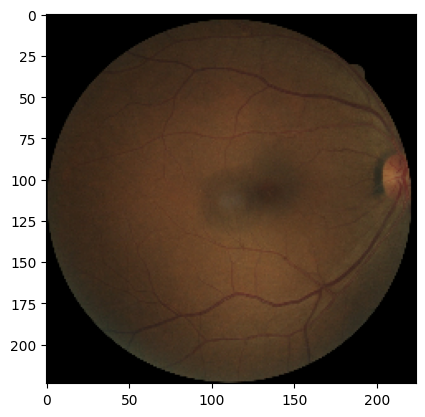

In [54]:
plt.imshow(features[0], cmap='bone')

(224, 224, 3)


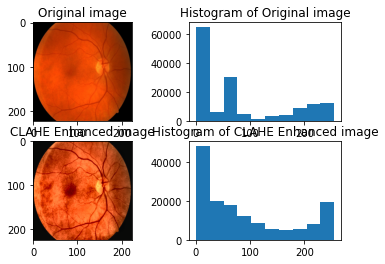

In [ ]:
clahe = cv2.createCLAHE(clipLimit=5.0, tileGridSize=(8,8))
def clahe_enhancer(img, demo=False):
    img_lab = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)

    #0 to 'L' channel, 1 to 'a' channel, and 2 to 'b' channel
    img_lab[:,:,0] = clahe.apply(img_lab[:,:,0])
    clahe_img = cv2.cvtColor(img_lab, cv2.COLOR_Lab2RGB)

    if demo:
        img_flattened = img.flatten()
        clahe_img_flattened = clahe_img.flatten()
        fig = plt.figure()
        rcParams['figure.figsize'] = 10,10

        plt.subplot(2, 2, 1)
        plt.imshow(img, cmap='bone')
        plt.title("Original image")

        plt.subplot(2, 2, 2)
        plt.hist(img_flattened)
        plt.title("Histogram of Original image")

        plt.subplot(2, 2, 3)
        plt.imshow(clahe_img, cmap='bone')
        plt.title("CLAHE Enhanced image")

        plt.subplot(2, 2, 4)
        plt.hist(clahe_img_flattened)
        plt.title("Histogram of CLAHE Enhanced image")

    return clahe_img

clahe_img = clahe_enhancer(trainX[0], True)
print(clahe_img.shape)

(224, 224, 3)


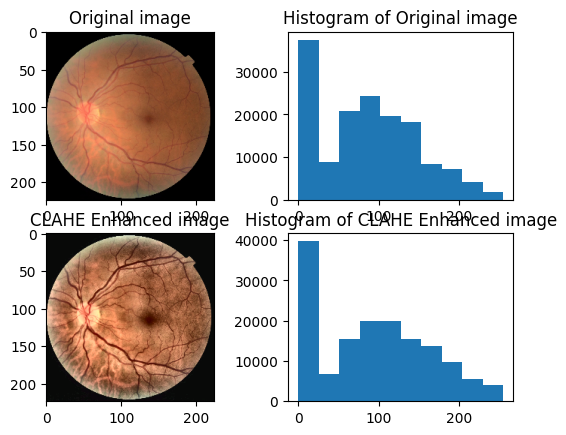

In [55]:
clahe = cv2.createCLAHE(clipLimit=5.0, tileGridSize=(8,8))
def clahe_enhancer(img, demo=False):
    img_lab = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)

    #0 to 'L' channel, 1 to 'a' channel, and 2 to 'b' channel
    img_lab[:,:,0] = clahe.apply(img_lab[:,:,0])
    clahe_img = cv2.cvtColor(img_lab, cv2.COLOR_Lab2RGB)

    if demo:
        img_flattened = img.flatten()
        clahe_img_flattened = clahe_img.flatten()
        fig = plt.figure()
        rcParams['figure.figsize'] = 10,10

        plt.subplot(2, 2, 1)
        plt.imshow(img, cmap='bone')
        plt.title("Original image")

        plt.subplot(2, 2, 2)
        plt.hist(img_flattened)
        plt.title("Histogram of Original image")

        plt.subplot(2, 2, 3)
        plt.imshow(clahe_img, cmap='bone')
        plt.title("CLAHE Enhanced image")

        plt.subplot(2, 2, 4)
        plt.hist(clahe_img_flattened)
        plt.title("Histogram of CLAHE Enhanced image")

    return clahe_img

clahe_img = clahe_enhancer(trainX[0], True)
print(clahe_img.shape)

In [ ]:
clahe_features = []
for img in trainX:
    clahe_img = clahe_enhancer(img, False)
    clahe_features.append(clahe_img)
clahe_features = np.array(clahe_features)
clahe_features.shape

(4000, 224, 224, 3)

## BUILD

### Hyperparameters

In [58]:
num_classes = 2
input_shape = (224, 224, 3)
learning_rate = 0.001
weight_decay = 0.0001
batch_size = 20
num_epochs = 100
image_size = 72                        # We'll resize input images to this size
patch_size = 6                         # Size of the patches to be extract from the input images
num_patches = (image_size // patch_size) ** 2
projection_dim = 64
num_heads = 4
transformer_units = [projection_dim * 2,
                     projection_dim,]  # Size of the transformer layers
transformer_layers = 8
mlp_head_units = [2048, 1024]          # Size of the dense layers of the final classifier

### Data Augmentation

In [60]:
# from tensorflow.keras.layers import *
# data_augmentation = keras.Sequential([layers.Normalization(),
#                                       layers.Resizing(image_size, image_size),
#                                       layers.RandomFlip("horizontal"),
#                                       layers.RandomRotation(factor=0.02),
#                                       layers.RandomZoom(height_factor=0.2, width_factor=0.2),],
#                                      name="data_augmentation",)
# data_augmentation = Sequential([tf.keras.layers.experimental.preprocessing.Normalization(),
#                                 tf.keras.layers.experimental.preprocessing.Resizing(image_size, image_size),],
#                                name="data_augmentation",)
# # Compute the mean and the variance of the training data for normalization.
# data_augmentation.layers[0].adapt(trainX)


import tensorflow as tf
from tensorflow.keras import Sequential

# Define the image size
image_size = 224  # Replace with your desired image size

# Data augmentation pipeline
data_augmentation = Sequential([
    tf.keras.layers.Normalization(),
    tf.keras.layers.Resizing(image_size, image_size),
], name="data_augmentation")

# Compute the mean and the variance of the training data for normalization.
data_augmentation.layers[0].adapt(trainX)

### Implement multilayer perceptron (MLP)

In [61]:
def mlp(x, hidden_units, dropout_rate):
    for units in hidden_units:
        x = layers.Dense(units, activation=tf.nn.gelu)(x)
        x = layers.Dropout(dropout_rate)(x)
    return x

### Implement patch creation as a layer

In [62]:
from tensorflow.keras import layers
class Patches(layers.Layer):
    def __init__(self, patch_size):
        super(Patches, self).__init__()
        self.patch_size = patch_size

    def call(self, images):
        batch_size = tf.shape(images)[0]
        patches = tf.image.extract_patches(images=images,
                                           sizes=[1, self.patch_size, self.patch_size, 1],
                                           strides=[1, self.patch_size, self.patch_size, 1],
                                           rates=[1, 1, 1, 1],
                                           padding="VALID",)
        patch_dims = patches.shape[-1]
        patches = tf.reshape(patches, [batch_size, -1, patch_dims])
        return patches

Image size: 72 X 72
Patch size: 6 X 6
Patches per image: 144
Elements per patch: 108


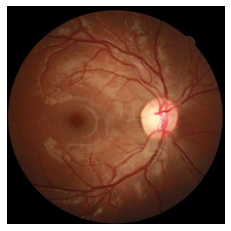

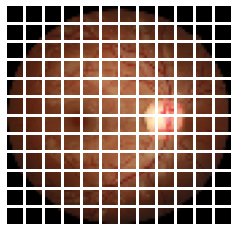

In [ ]:
plt.figure(figsize=(4, 4))
image = trainX[np.random.choice(range(trainX.shape[0]))]
plt.imshow(image.astype("uint8"))
plt.axis("off")

resized_image = tf.image.resize(tf.convert_to_tensor([image]), size=(image_size, image_size))
patches = Patches(patch_size)(resized_image)
print(f"Image size: {image_size} X {image_size}")
print(f"Patch size: {patch_size} X {patch_size}")
print(f"Patches per image: {patches.shape[1]}")
print(f"Elements per patch: {patches.shape[-1]}")

n = int(np.sqrt(patches.shape[1]))
plt.figure(figsize=(4, 4))
for i, patch in enumerate(patches[0]):
    ax = plt.subplot(n, n, i + 1)
    patch_img = tf.reshape(patch, (patch_size, patch_size, 3))
    plt.imshow(patch_img.numpy().astype("uint8"))
    plt.axis("off")

### Implement the patch encoding layer

The `PatchEncoder` layer will linearly transform a patch by projecting it into a
vector of size `projection_dim`. In addition, it adds a learnable position
embedding to the projected vector.

In [64]:
class PatchEncoder(layers.Layer):
    def __init__(self, num_patches, projection_dim):
        super(PatchEncoder, self).__init__()
        self.num_patches = num_patches
        self.projection = layers.Dense(units=projection_dim)
        self.position_embedding = layers.Embedding(input_dim=num_patches, output_dim=projection_dim)

    def call(self, patch):
        positions = tf.range(start=0, limit=self.num_patches, delta=1)
        encoded = self.projection(patch) + self.position_embedding(positions)
        return encoded

### VIT

In [65]:
def create_vit_classifier():
    inputs = layers.Input(shape=input_shape)
    augmented = data_augmentation(inputs)
    patches = Patches(patch_size)(augmented)
    encoded_patches = PatchEncoder(num_patches, projection_dim)(patches)

    # Create multiple layers of the Transformer block.
    for _ in range(transformer_layers):
        x1 = layers.LayerNormalization(epsilon=1e-6)(encoded_patches)
        attention_output = layers.MultiHeadAttention(num_heads=num_heads, key_dim=projection_dim, dropout=0.1)(x1, x1)
        x2 = layers.Add()([attention_output, encoded_patches])
        x3 = layers.LayerNormalization(epsilon=1e-6)(x2)
        x3 = mlp(x3, hidden_units=transformer_units, dropout_rate=0.1)
        encoded_patches = layers.Add()([x3, x2])

    # Create a [batch_size, projection_dim] tensor.
    representation = layers.LayerNormalization(epsilon=1e-6)(encoded_patches)
    representation = layers.Flatten()(representation)
    representation = layers.Dropout(0.5)(representation)

    # Add MLP.
    features = mlp(representation, hidden_units=mlp_head_units, dropout_rate=0.5)
    logits = layers.Dense(num_classes)(features)
    model = tf.keras.Model(inputs=inputs, outputs=logits)
    return model

## COMPILE

In [66]:
vit_classifier = create_vit_classifier()

In [ ]:
INIT_LR = 1e-3
EPOCHS = 25
BS = 8

optimizer = tfa.optimizers.AdamW(learning_rate=learning_rate, weight_decay=weight_decay)
# optimizer = tf.keras.optimizers.Adam(lr=learning_rate, decay=weight_decay)
# opt = Adam(lr=INIT_LR, decay=INIT_LR / EPOCHS)

vit_classifier.compile(optimizer=optimizer,
                       loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
                       metrics=[tf.keras.metrics.SparseCategoricalAccuracy(name="accuracy")])

In [ ]:
# tf.keras.utils.plot_model(vit_classifier, to_file='vit_model.png', show_shapes=True, show_dtype=False,
#                           show_layer_names=True, rankdir='TB', expand_nested=False, dpi=96)

## TRAINING

In [ ]:
es = EarlyStopping(monitor='val_loss',
                   mode='min',
                   patience=3,
                   restore_best_weights=True,
                   verbose=1)

reduce_lr = ReduceLROnPlateau(monitor = 'val_loss',
                              factor = 0.2,
                              patience = 3,
                              min_lr = 1e-5,
                              mode = 'min',
                              verbose=1)

metric = 'val_loss'
checkpoint_callback = ModelCheckpoint("VIT_weights.hdf5",
                                      monitor=metric,
                                      save_best_only=True,
                                      save_weights_only=True,
                                      verbose = 2,
                                      mode='max')

In [ ]:
vit_history = vit_classifier.fit(x=trainX,
                                 y=trainY,
                                 batch_size=batch_size,
                                 epochs=50,
                                 validation_split=0.1,
                                 callbacks=[checkpoint_callback])

Epoch 1/50
179/180 [============================>.] - ETA: 0s - loss: 1.8844 - accuracy: 0.7128
Epoch 1: val_loss improved from -inf to 0.48210, saving model to VIT_weights.hdf5
180/180 [==============================] - 18s 47ms/step - loss: 1.8759 - accuracy: 0.7136 - val_loss: 0.4821 - val_accuracy: 0.8175
Epoch 2/50
179/180 [============================>.] - ETA: 0s - loss: 0.5534 - accuracy: 0.7860
Epoch 2: val_loss improved from 0.48210 to 0.49276, saving model to VIT_weights.hdf5
180/180 [==============================] - 7s 41ms/step - loss: 0.5531 - accuracy: 0.7861 - val_loss: 0.4928 - val_accuracy: 0.8175
Epoch 3/50
179/180 [============================>.] - ETA: 0s - loss: 0.5375 - accuracy: 0.8039
Epoch 3: val_loss did not improve from 0.49276
180/180 [==============================] - 7s 39ms/step - loss: 0.5381 - accuracy: 0.8036 - val_loss: 0.4784 - val_accuracy: 0.8175
Epoch 4/50
179/180 [============================>.] - ETA: 0s - loss: 0.5268 - accuracy: 0.8000
Epoch

In [ ]:
vit_classifier.load_weights("VIT_weights.hdf5")
_, accuracy = vit_classifier.evaluate(x_test, y_test)
print(f"Test accuracy: {round(accuracy * 100, 2)}%")

32/32 [==============================] - 2s 26ms/step - loss: 0.5264 - accuracy: 0.8060
Test accuracy: 80.6%


In [ ]:
HistoryDict = vit_history.history

val_losses = HistoryDict["val_loss"]
val_acc = HistoryDict["val_accuracy"]
acc = HistoryDict["accuracy"]
losses = HistoryDict["loss"]
epochs = range(1,len(val_losses)+1)

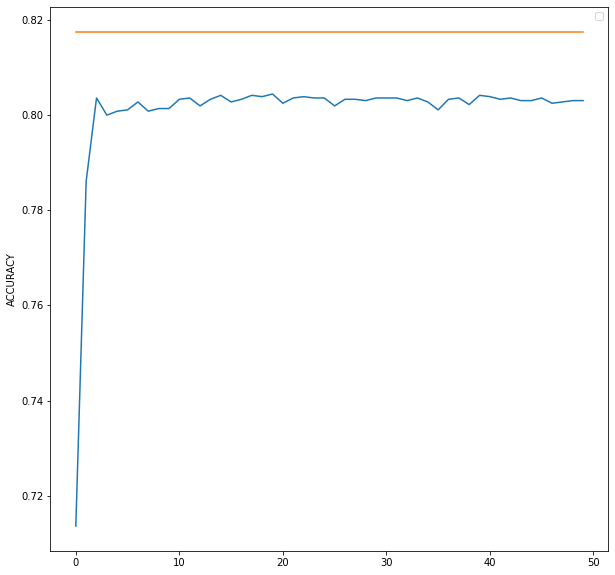

In [ ]:
plt.plot(vit_history.history["accuracy"])
plt.plot(vit_history.history["val_accuracy"])
plt.ylabel("ACCURACY")
plt.legend()
plt.show()

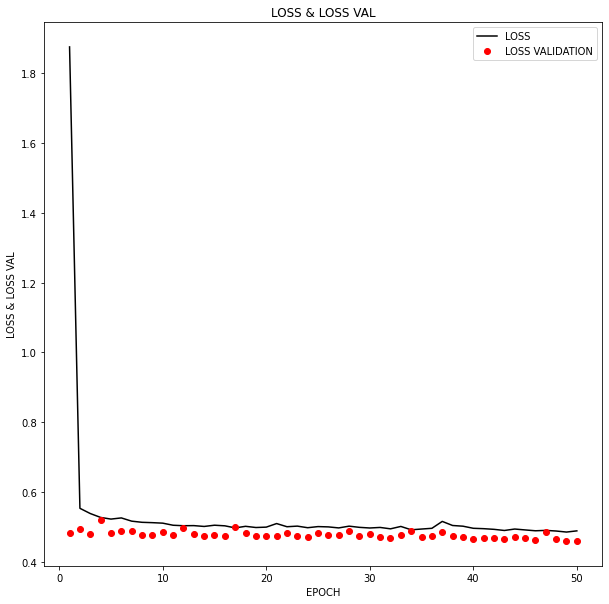

In [ ]:
plt.plot(epochs,losses,"k-",label="LOSS")
plt.plot(epochs,val_losses,"ro",label="LOSS VALIDATION")
plt.title("LOSS & LOSS VAL")
plt.xlabel("EPOCH")
plt.ylabel("LOSS & LOSS VAL")
plt.legend()
plt.show()

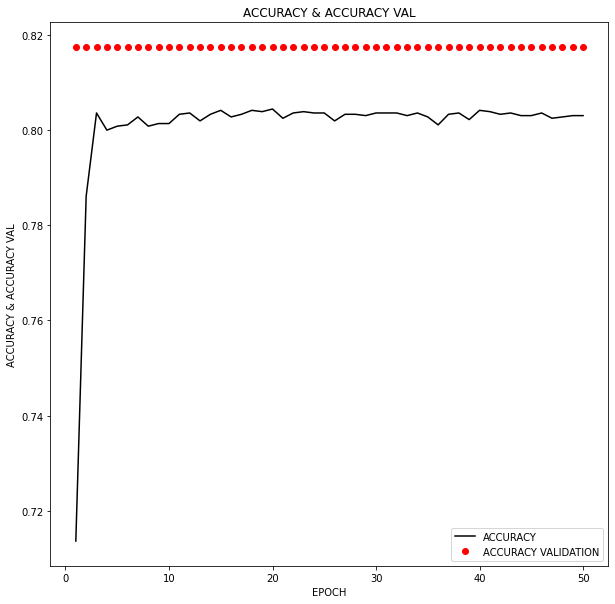

In [ ]:
plt.plot(epochs,acc,"k-",label="ACCURACY")
plt.plot(epochs,val_acc,"ro",label="ACCURACY VALIDATION")
plt.title("ACCURACY & ACCURACY VAL")
plt.xlabel("EPOCH")
plt.ylabel("ACCURACY & ACCURACY VAL")
plt.legend()
plt.show()

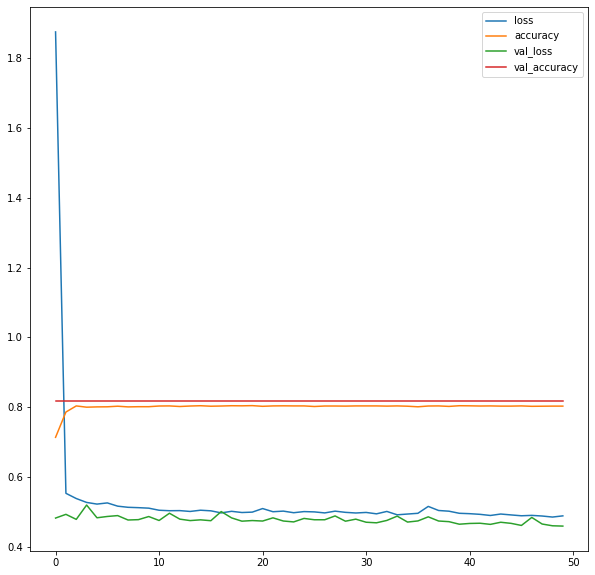

In [ ]:
vit_Summary = pd.DataFrame(vit_history.history)
vit_Summary.plot()

## PERFORMANCE OF THE TRAINED MODEL

In [ ]:
vit_classifier.load_weights("VIT_weights.hdf5")

evaluate = vit_classifier.evaluate(x_test, y_test)
print('Accuracy Test : {}'.format(evaluate[1]))

32/32 [==============================] - 1s 26ms/step - loss: 0.5264 - accuracy: 0.8060
Accuracy Test : 0.8059999942779541


In [ ]:
# import cv2
prediction = []
original = y_test
image = []
count = 0

for item in x_test:
    img= item
    img = img.reshape(-1,224,224,3)
    predict = vit_classifier.predict(img)
    predict = np.argmax(predict)
    prediction.append(predict)

# Getting the test accuracy
score = accuracy_score(original, prediction)
print("Test Accuracy : {}".format(score))

Test Accuracy : 0.806


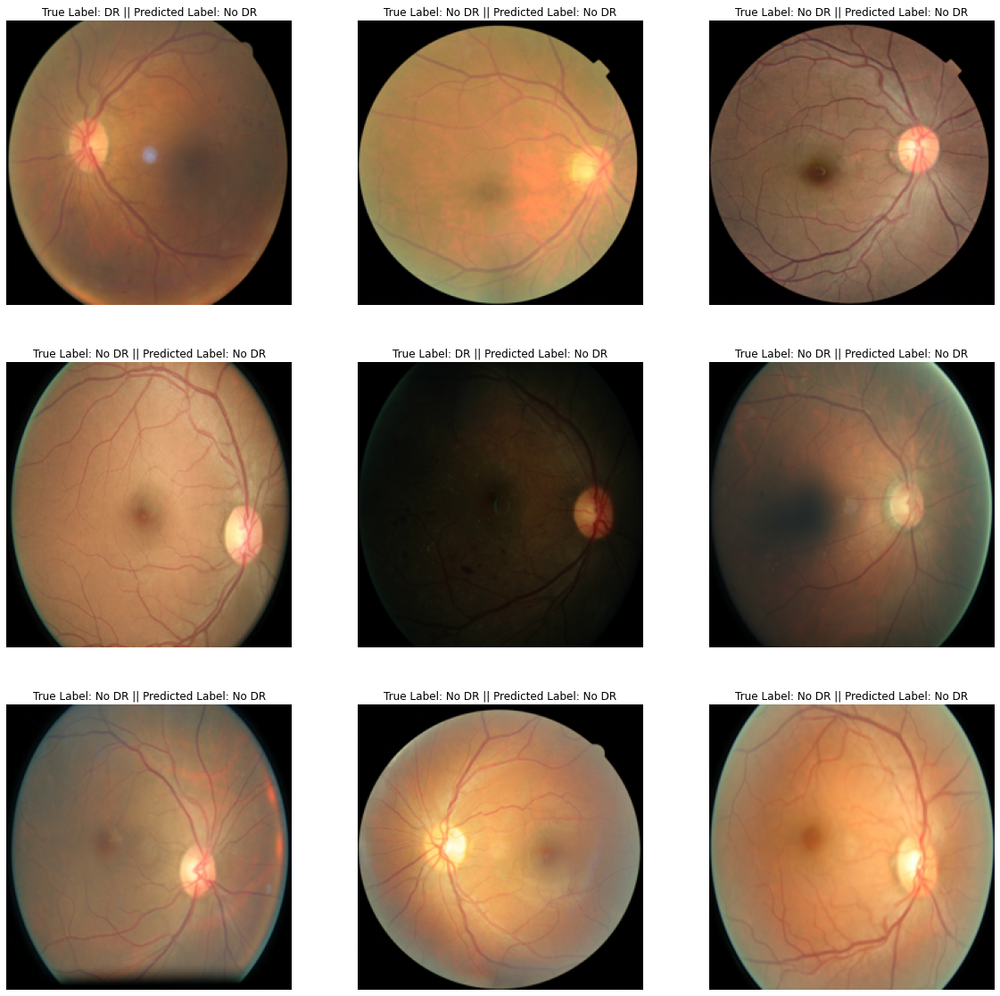

In [ ]:
class_names = ['No DR','DR']
import random
plt.figure(figsize = (20,20))
for i in range(9):
    random_int_index = random.choice(range(len(x_test)))
    plt.subplot(3,3,i+1)
    plt.imshow(x_test[random_int_index])
    if prediction[random_int_index] == original[random_int_index]:
        color = "g"
    else:
        color = "r"
    plt.title("True Label: " + class_names[original[random_int_index][0]] + " || " + "Predicted Label: " +
              class_names[prediction[random_int_index]])
    plt.axis(False);

In [ ]:
# accuracy, sensitivity, and specificity
cm = confusion_matrix(np.asarray(original), np.asarray(prediction))
total = sum(sum(cm))
acc = (cm[0, 0] + cm[1, 1]) / total
sensitivity = cm[0, 0] / (cm[0, 0] + cm[0, 1])
specificity = cm[1, 1] / (cm[1, 0] + cm[1, 1])
# show the confusion matrix, accuracy, sensitivity, and specificity
print(cm)
print("acc: {:.4f}".format(acc))
print("sensitivity: {:.4f}".format(sensitivity))
print("specificity: {:.4f}".format(specificity))

[[806   0]
 [194   0]]
acc: 0.8060
sensitivity: 1.0000
specificity: 0.0000


In [ ]:
# Print out the classification report
print(classification_report(np.asarray(original), np.asarray(prediction)))

              precision    recall  f1-score   support

           0       0.81      1.00      0.89       806
           1       0.00      0.00      0.00       194

    accuracy                           0.81      1000
   macro avg       0.40      0.50      0.45      1000
weighted avg       0.65      0.81      0.72      1000



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
